### Applied Data Analysis
### Assignment 4
**Name**: Riya Shyam Huddar

**Roll no.**: MDS202431

In [327]:
import networkx as nx
import random
import matplotlib.cm as cm
import networkx as nx
import matplotlib.pyplot as plt
import itertools
import numpy as np

### Enron Email Network - Community Detection

### Dataset Overview

The Enron email dataset represents a communication network among Enron employees and external contacts. It was originally released by the **Federal Energy Regulatory Commission** during the investigation of Enron in the early 2000s.  

- **Nodes:** Email addresses (both Enron employees and external contacts).  
- **Edges:** An undirected edge exists between two nodes if at least one email was sent between them.  
- **Graph type:** Undirected network capturing email communication.  
- **Size:** The full dataset contains **36,692 nodes** and **~183,831 edges**.  
- **Special notes:**  
  - Non-Enron email addresses act as **sources or sinks**; we only observe their communication with Enron employees.  
  - The network is **sparse** but has a few high-degree nodes (employees who communicate with many others).  

This dataset is ideal for **community detection**, as it allows us to uncover clusters of frequent communication—both within the company and with external contacts.  


In [121]:
import networkx as nx

G = nx.read_edgelist("D:/CMI/ADA/Assignment_4/email-Enron.txt.gz")

print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
print(f"Is directed: {G.is_directed()}")


Number of nodes: 36692
Number of edges: 183831
Is directed: False


### Exploratory Data Analysis (EDA)

### Degree Distribution of the Enron Email Network

The histogram above shows the **degree distribution** of nodes in the Enron email network.  

- **Observation:** The distribution is **highly skewed (left-skewed)**, indicating that most nodes have a **low degree** (send/receive few emails), while a small number of nodes are **highly connected** (hubs with many email interactions).  
- This kind of distribution is typical for real-world communication networks, where a few key individuals act as central connectors.  
- Such skewed degree distributions suggest that community detection algorithms may reveal **dense clusters around high-degree nodes**.


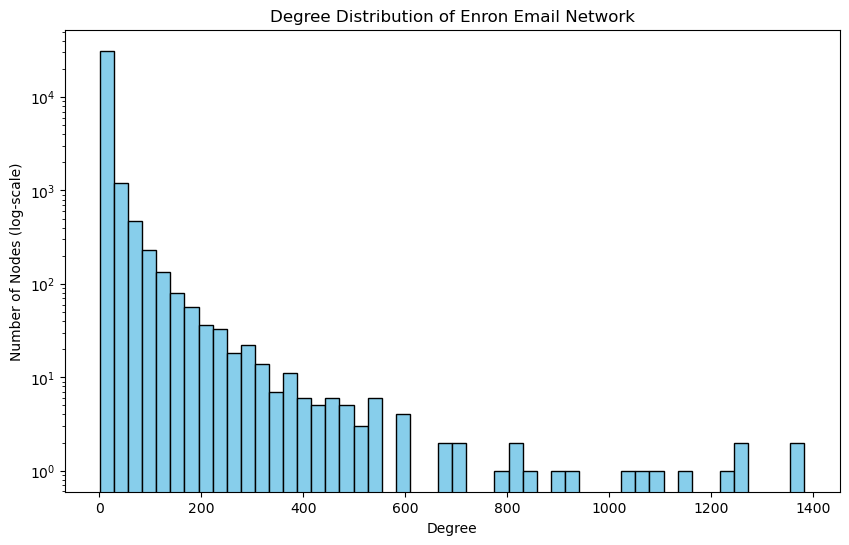

In [375]:
# Plot degree distribution

degrees = [d for n, d in G.degree()]
plt.figure(figsize=(10,6))
plt.hist(degrees, bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Degree')
plt.ylabel('Number of Nodes (log-scale)')
plt.title('Degree Distribution of Enron Email Network')
plt.yscale('log')  # optional: log scale to better see the tail
plt.show()


### Degree Analysis

- The network has a **skewed degree distribution** with a few highly connected hubs.  
- **Min / Max degree:** 1 / 1383  
- **Mean / Median degree:** 10.73 / 3  
- **Top nodes by degree:** 5038, 273, 458, 140, 1028, 195, 370, 1139, 136, 566


### Maximum Node Degree

The maximum degree in the network is **1383**, meaning there is at least one node (email address) that communicated with **1383 distinct addresses**.  

- This confirms the presence of **hub nodes**—highly connected individuals who act as central points of communication.  
- Such hubs are important in community detection because they can **bridge multiple clusters** or form the core of dense communities.  
- This also justifies our approach of selecting a **core subgraph of top-degree nodes**, as it captures the most active part of the network for analysis.


In [355]:
# Degree analysis
degrees = [d for n, d in G.degree()]

# Basic statistics
import numpy as np
min_deg = np.min(degrees)
max_deg = np.max(degrees)
mean_deg = np.mean(degrees)
median_deg = np.median(degrees)
std_deg = np.std(degrees)

print("Degree Statistics:")
print(f"  Min: {min_deg}")
print(f"  Max: {max_deg}")
print(f"  Mean: {mean_deg:.2f}")
print(f"  Median: {median_deg}")
print(f"  Std Dev: {std_deg:.2f}")

# Top 10 nodes by degree
top_nodes = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:10]
print("\nTop 10 nodes by degree:")
for node, deg in top_nodes:
    print(f"  Node {node}: Degree {deg}")


Degree Statistics:
  Min: 1
  Max: 1383
  Mean: 10.73
  Median: 3.0
  Std Dev: 37.59

Top 10 nodes by degree:
  Node 5038: Degree 1383
  Node 273: Degree 1367
  Node 458: Degree 1261
  Node 140: Degree 1245
  Node 1028: Degree 1244
  Node 195: Degree 1143
  Node 370: Degree 1099
  Node 1139: Degree 1068
  Node 136: Degree 1026
  Node 566: Degree 924


Before community detection, we removed **self-loops** (emails sent to self) and extracted the **largest connected component** to focus on the main connected portion of the network.  
This ensures more accurate and meaningful community detection results.


In [127]:
# Remove self-loops (emails to self)
G.remove_edges_from(nx.selfloop_edges(G))

# Extract the largest connected component
largest_cc = max(nx.connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()

print(f"Cleaned graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")


Cleaned graph: 33696 nodes, 180811 edges


### Enron Email Network - Basic Statistics

After preprocessing (removing self-loops and disconnected components), the Enron email network has the following properties:

- **Number of nodes:** 33,696  
- **Number of edges:** 180,811  
- **Average degree:** 10.73  
- **Density:** 0.00032 (very sparse)  
- **Is connected:** Yes (the network forms a single connected component)  
- **Number of connected components:** 1  

**Observations:**  
- The network is **very sparse**, with most nodes having relatively few connections.  
- Despite the large size, the network is **fully connected**, meaning there is a path between any two email addresses.  
- This structure is typical for communication networks: a few nodes (hubs) are highly connected, while most nodes have moderate to low degree.


In [365]:
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Average degree:", np.mean([d for _, d in G.degree()]))
print("Density:", nx.density(G))
print("Is connected:", nx.is_connected(G))
print("Number of connected components:", nx.number_connected_components(G))


Number of nodes: 33696
Number of edges: 180811
Average degree: 10.731896961063628
Density: 0.0003185011711252004
Is connected: True
Number of connected components: 1


### Clustering Coefficient

The **average clustering coefficient** of the Enron email network is **0.5092**, indicating a **high tendency for nodes to form tightly-knit groups**.  
This aligns with the expectation that employees frequently communicate within teams or close workgroups.


In [367]:
avg_clustering = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {avg_clustering:.4f}")

Average Clustering Coefficient: 0.5092


### Degree Assortativity

The **degree assortativity coefficient** measures the tendency of nodes to connect to others with similar degree.  

- Value: **-0.1165**  
- Interpretation: Slight **disassortative mixing**, meaning high-degree nodes tend to connect with low-degree nodes rather than with other high-degree nodes.


In [370]:
# Degree Assortativity
assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree Assortativity Coefficient: {assortativity:.4f}")


Degree Assortativity Coefficient: -0.1165


### Visualization of the Full Enron Email Network

The figure above shows the **entire Enron email communication network** after preprocessing (removing self-loops and disconnected components).  

**Observations:**  
- The network is **large and sparse**, with 33,696 nodes and 180,811 edges.  
- A few **highly connected hubs** dominate the network, while most nodes have relatively few connections, reflecting a typical communication pattern in organizational email networks.  
- Direct visualization of all nodes is **overcrowded**, making it difficult to identify individual communities or smaller structures.  

**Implication for community detection:**  
- Due to the **size and density**, running community detection on the full network is computationally expensive.  

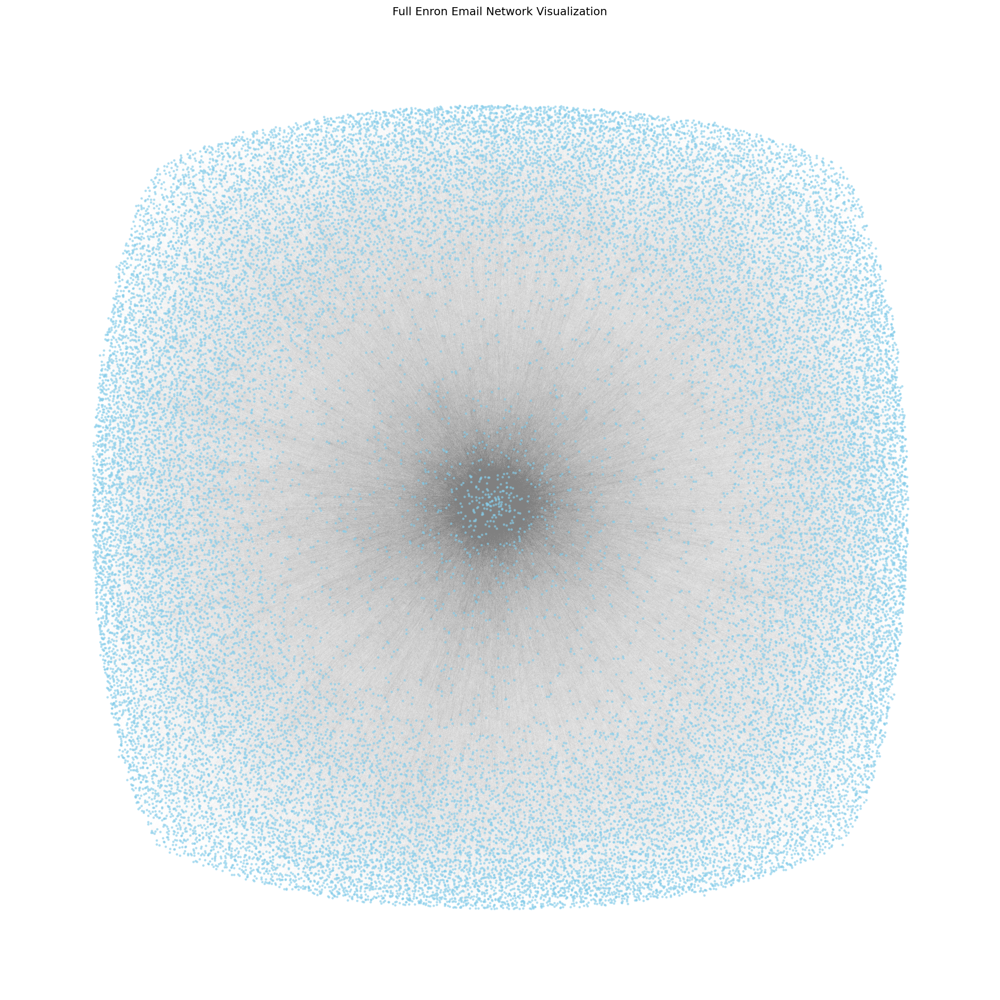

In [139]:
pos = nx.spring_layout(G, k=0.15, iterations=10, seed=42)


plt.figure(figsize=(15, 15), dpi=150)

# Node properties
nx.draw_networkx_nodes(
    G, pos,
    node_size=3,       
    alpha=0.5,          
    node_color='skyblue', 
)

# Edge properties
nx.draw_networkx_edges(
    G, pos,
    alpha=0.005,      
    edge_color='gray',  
    width=0.3         
)

plt.title('Full Enron Email Network Visualization')
plt.axis('off')
plt.tight_layout()
plt.show()


### Centrality Analysis of the Enron Email Network

To identify the most influential nodes in the network, we computed three types of centrality measures:

1. **Degree Centrality**  
   - Measures the fraction of nodes each node is directly connected to.  
   - **Top 5 nodes:** 5038, 273, 458, 140, 1028  
   - Interpretation: These nodes have the **most direct connections**, likely representing key communicators or hubs in the organization.

2. **Eigenvector Centrality**  
   - Measures influence by considering not just direct connections but also the **importance of connected nodes**.  
   - **Top 5 nodes:** 136, 195, 76, 370, 1028  
   - Interpretation: Nodes with high eigenvector centrality are **well-connected to other influential nodes**, indicating strategic positions in the communication network.

3. **Closeness Centrality**  
   - Measures how close a node is to all other nodes in terms of shortest paths.  
   - **Top 5 nodes:** 136, 76, 46, 140, 370  
   - Interpretation: These nodes can **quickly reach all other nodes** in the network and are central for efficient information spread.

**Observations:**  
- Node 1028 appears in both **degree and eigenvector centrality**, highlighting it as a high-degree hub connected to influential nodes.  
- Node 136 is top-ranked in both **eigenvector and closeness centrality**, suggesting it is both influential and central in terms of network reach.  
- Different centrality measures highlight different aspects of influence: **local connectivity (degree), global influence (eigenvector), and network accessibility (closeness)**.  

These metrics provide insight into **key players in the Enron email network** and are useful for understanding how information might propagate through the organization.


In [141]:

# Degree Centrality

deg_centrality = nx.degree_centrality(G)
top_deg = sorted(deg_centrality.items(), key=lambda x: x[1], reverse=True)[:5]


# Eigenvector Centrality

eig_centrality = nx.eigenvector_centrality(G, max_iter=200)
top_eig = sorted(eig_centrality.items(), key=lambda x: x[1], reverse=True)[:5]


#  Closeness Centrality

clo_centrality = nx.closeness_centrality(G)
top_clo = sorted(clo_centrality.items(), key=lambda x: x[1], reverse=True)[:5]


# Print top nodes

print("Top 5 nodes by Degree Centrality:")
for node, val in top_deg:
    print(node, round(val, 4))

print("\nTop 5 nodes by Eigenvector Centrality:")
for node, val in top_eig:
    print(node, round(val, 4))

print("\nTop 5 nodes by Closeness Centrality:")
for node, val in top_clo:
    print(node, round(val, 4))


Top 5 nodes by Degree Centrality:
5038 0.041
273 0.0406
458 0.0374
140 0.0369
1028 0.0369

Top 5 nodes by Eigenvector Centrality:
136 0.1496
195 0.1271
76 0.1265
370 0.1213
1028 0.1124

Top 5 nodes by Closeness Centrality:
136 0.3874
76 0.3861
46 0.3791
140 0.3748
370 0.3745


### Helper Functions

- **`community_stats`**: Summarizes community sizes and modularity.  
- **`plot_community_core`**: Visualizes communities, optionally filtering nodes by degree for clarity.  

These functions make community analysis and visualization easier.


In [147]:
def community_stats(communities, G):
    sizes = [len(c) for c in communities]
    num_comms = len(sizes)
    largest = max(sizes)
    smallest = min(sizes)
    mean_size = sum(sizes)/num_comms
    median_size = sorted(sizes)[num_comms//2]
    
    # Compute modularity using NetworkX
    import networkx as nx
    mod = nx.algorithms.community.modularity(G, communities)
    
    print(f"Number of communities: {num_comms}")
    print(f"Modularity: {mod:.4f}")
    print(f"Community sizes → min: {smallest}, max: {largest}, mean: {mean_size:.2f}, median: {median_size}")


In [156]:
def plot_community_core(G, communities, degree_threshold=5, title="Community Visualization", cmap=plt.cm.tab20, node_size=50, iterations=50, seed=42):
    # Create a dict: node -> community id
    comm_dict = {}
    for cid, nodes in enumerate(communities):
        for n in nodes:
            comm_dict[n] = cid
    
    # Filter nodes by degree
    nodes_to_draw = [node for node, degree in G.degree() if degree >= degree_threshold]
    H_draw = G.subgraph(nodes_to_draw).copy()
    
    # Assign community colors
    node_colors = [comm_dict[n] for n in H_draw.nodes()]
    
    # Layout and plot
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(H_draw, k=0.1, iterations=iterations, seed=seed)
    nx.draw(
        H_draw,
        pos,
        node_color=node_colors,
        cmap=cmap,
        node_size=node_size,
        alpha=0.8,
        linewidths=0.5,
        with_labels=False
    )
    plt.title(f"{title} (Nodes with Degree ≥ {degree_threshold})", fontsize=14)
    plt.show()


----

### 1. Louvain Algorithm

### Louvain Community Detection

We applied the **Louvain method** to detect communities in the full Enron email network.

- **Number of communities detected:** 171  
- **Modularity:** 0.6013 (high, indicating strong community structure)  
- **Community sizes:**  
  - Minimum: 3 nodes  
  - Maximum: 4,139 nodes  
  - Mean: 197 nodes  
  - Median: 8 nodes  

**Observations:**  
- The Louvain method reveals a **rich hierarchical structure** in the network.  
- Many small communities exist, along with a few **large hub-based clusters**, reflecting the organization’s communication patterns.  
- Compared to Girvan-Newman on cores, Louvain provides **scalable and meaningful results** for the full network.


In [15]:
import community as community_louvain

# Compute the best partition
partition = community_louvain.best_partition(G)

# Compute modularity
modularity = community_louvain.modularity(partition, G)

print("Number of communities detected:", len(set(partition.values())))
print("Modularity:", modularity)


Number of communities detected: 171
Modularity: 0.6012892843350657


In [152]:
# Convert partition dict to list of sets
from collections import defaultdict

comm_dict = defaultdict(set)
for node, cid in partition.items():
    comm_dict[cid].add(node)

louvain_communities = list(comm_dict.values())

# Now call the stats function
community_stats(louvain_communities, G)


Number of communities: 171
Modularity: 0.6013
Community sizes → min: 3, max: 4139, mean: 197.05, median: 8


>Visualization focuses on nodes with **degree ≥ 5** to highlight the core structure.
>
>This method is **computationally efficient**, suitable for large networks like Enron.


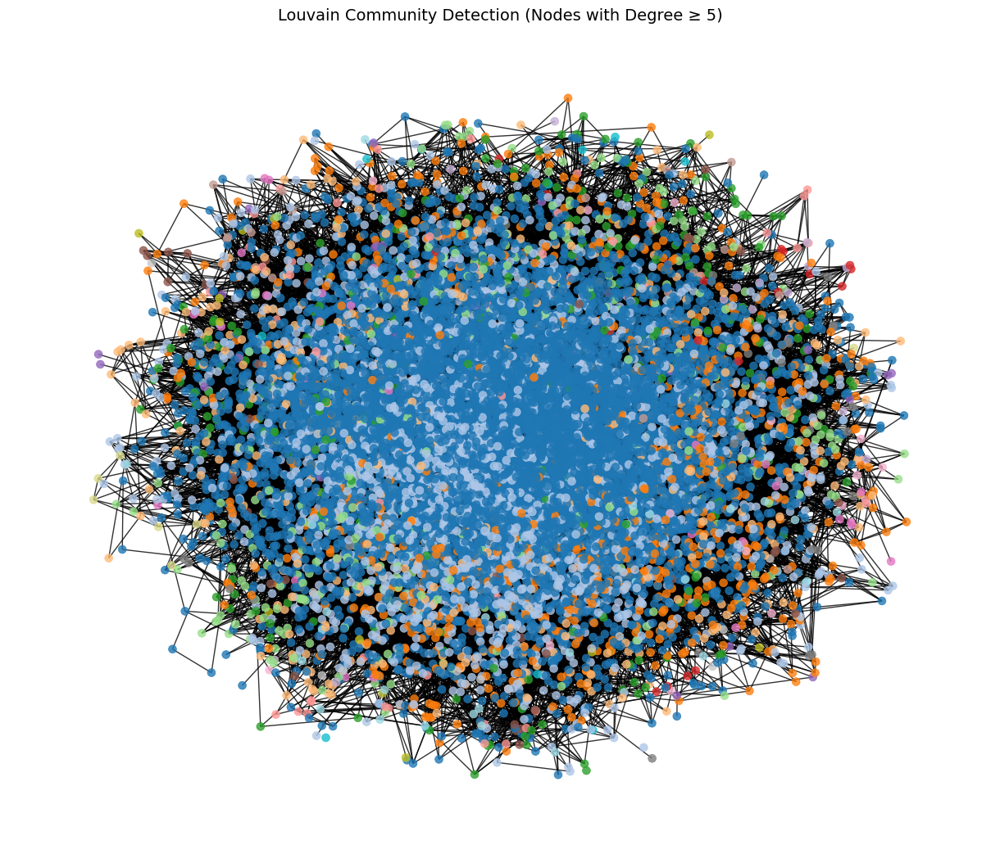

In [158]:
plot_community_core(G, louvain_communities, degree_threshold=5, title="Louvain Community Detection")

### 2. Girvan Newman Algorithm

### Preparing a Subgraph for Girvan–Newman (GN) Community Detection

For the Girvan–Newman algorithm, we focus on a **moderate-degree subgraph** rather than the entire network.

**Rationale:**
- The **full Enron network is very large** (~33k nodes, ~180k edges), making GN computationally expensive.
- Nodes with **extremely high or low degrees** can distort edge-betweenness calculations:
  - High-degree hubs dominate the GN splits.
  - Low-degree peripheral nodes add noise without contributing much to meaningful communities.
- By selecting **nodes with moderate degrees (10–30)** and extracting the **largest connected component**, we:
  - Reduce computational complexity.
  - Focus on the portion of the network where community structure is most interpretable.
- This allows us to **demonstrate GN hierarchies** effectively while keeping the analysis tractable.


In [304]:
# Moderate-degree nodes (avoid extremes)
sub_nodes = [n for n, d in G.degree() if 10 <= d <= 30]

# Take largest connected component
components = sorted(nx.connected_components(G.subgraph(sub_nodes)), key=len, reverse=True)
H_gn = G.subgraph(components[0]).copy()

# Print metrics
print(f"Subgraph GN metrics:\n  Nodes: {H_gn.number_of_nodes()}\n  Edges: {H_gn.number_of_edges()}")


Subgraph GN metrics:
  Nodes: 3432
  Edges: 6936


### Visualization of the Moderate-Degree Subgraph

The figure above shows the **moderate-degree subgraph** selected for Girvan–Newman analysis.

**Observations:**
- The subgraph contains **3,432 nodes and 6,936 edges**, representing the core portion of the network with moderate connectivity.
- High-degree hubs and very low-degree nodes are excluded to **highlight meaningful community structure**.
- Node positions are computed using a **spring layout**, where more strongly connected nodes cluster together.
- This visualization provides a **tractable and interpretable view** of the network for hierarchical community detection with Girvan–Newman.


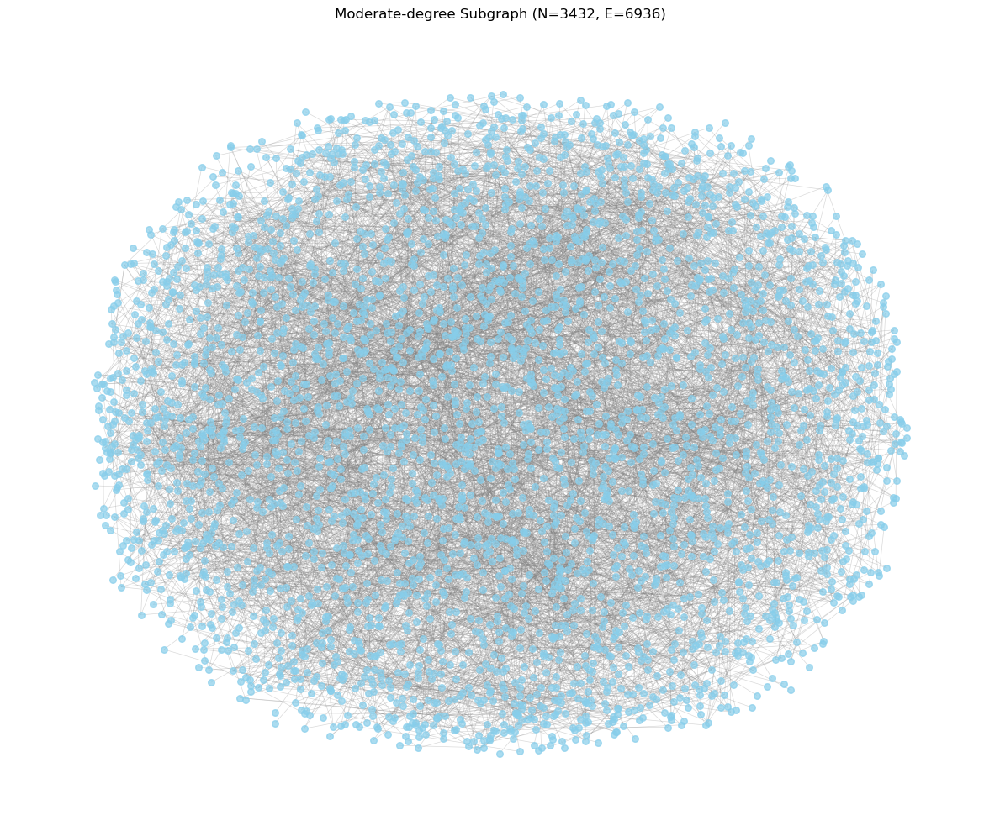

In [341]:
# Layout for the subgraph
pos = nx.spring_layout(H_gn, seed=42, k=0.15, iterations=30)

plt.figure(figsize=(12, 10))

# Draw nodes
nx.draw_networkx_nodes(
    H_gn, pos,
    node_size=30,
    node_color='skyblue',
    alpha=0.7
)

# Draw edges
nx.draw_networkx_edges(
    H_gn, pos,
    width=0.5,
    alpha=0.3,
    edge_color='gray'
)

plt.title(f"Moderate-degree Subgraph (N={H_gn.number_of_nodes()}, E={H_gn.number_of_edges()})")
plt.axis('off')
plt.tight_layout()
plt.show()


### Girvan–Newman Community Detection on the Moderate-Degree Subgraph

The **Girvan–Newman algorithm** was applied to the **degree-filtered subgraph** of the Enron email network.

**Key Details:**
- A **target split level of 3** was chosen to produce a manageable number of communities for demonstration.
- **Number of communities detected:** 4  
- **Community sizes:** range from **44 (small peripheral clusters) to 3069 (large connected groups)**, with an average size of 858 nodes.
- **Modularity:** 0.2581, reflecting the quality of the partition; typically lower than Louvain because the subgraph is smaller and filtered.
- Visualization includes nodes with **degree ≥ 3**, highlighting community structure while avoiding overcrowding.

> This demonstrates the **hierarchical nature of Girvan–Newman** and provides a tractable view of community structure in a large network.


In [344]:
from networkx.algorithms import community
from statistics import mean

print("Running Girvan–Newman on degree-filtered subgraph H_gn")

# Run GN generator
gn_generator = community.girvan_newman(H_gn)

# Choose a split level
target_level = 3
for i, comm in enumerate(gn_generator):
    if i == target_level - 1:
        communities = comm
        break

# Convert to list of sets for modularity
comm_list = [set(c) for c in communities]

# Compute modularity
modularity = community.modularity(H_gn, comm_list)

# Community size statistics
sizes = [len(c) for c in comm_list]
num_comms = len(comm_list)
largest = max(sizes)
smallest = min(sizes)
average = mean(sizes)

print("\nGirvan–Newman Community Detection Results:")
print(f"  Modularity (Level {target_level}): {modularity:.4f}")
print(f"  Number of Communities: {num_comms}")
print(f"  Largest Community Size: {largest}")
print(f"  Smallest Community Size: {smallest}")
print(f"  Average Community Size: {average:.2f}")


Running Girvan–Newman on degree-filtered subgraph H_gn

Girvan–Newman Community Detection Results:
  Modularity (Level 3): 0.2581
  Number of Communities: 4
  Largest Community Size: 3069
  Smallest Community Size: 44
  Average Community Size: 858.00


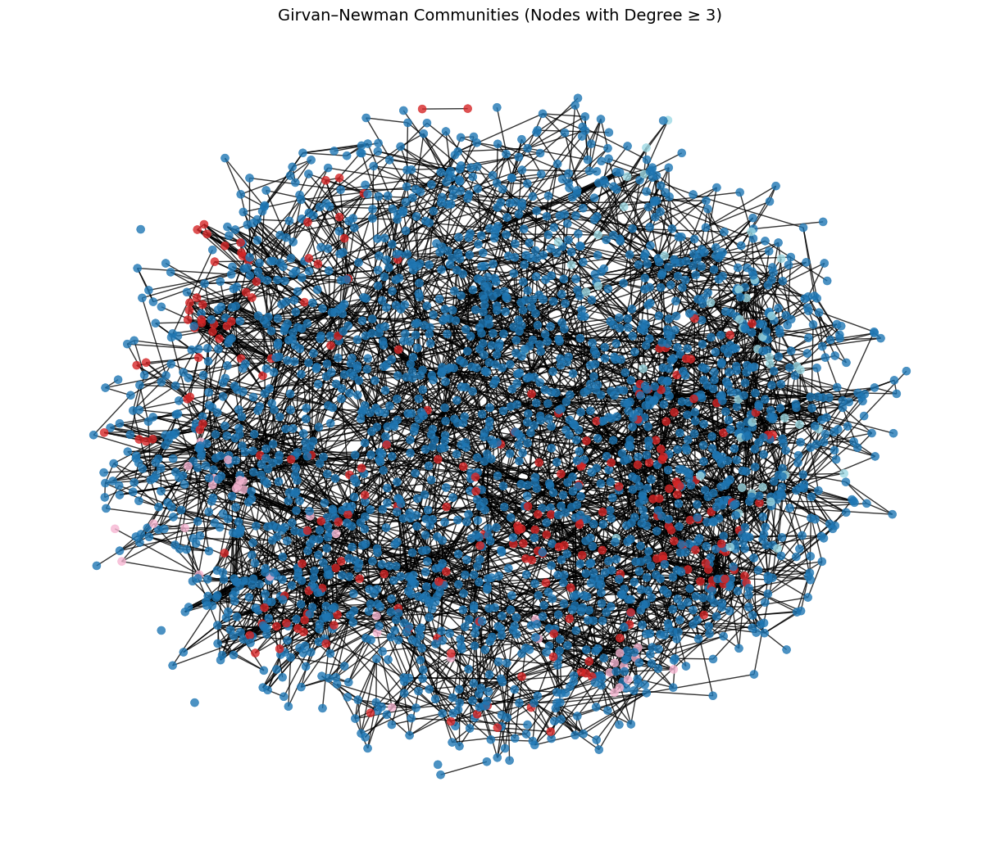

In [346]:
plot_community_core(H_gn, comm_list, degree_threshold=3, title="Girvan–Newman Communities")

### 3. Label Propagation

### Label Propagation Community Detection

The **Label Propagation algorithm** was applied to the **entire Enron email network**.  

**Results:**
- **Modularity:** 0.3433, indicating moderate community structure.
- **Number of Communities:** 1,679
- **Largest Community Size:** 18,589 nodes
- **Smallest Community Size:** 2 nodes
- **Average Community Size:** 20.07 nodes

**Key Points:**
- Label propagation is **fast and scalable**, making it suitable for large networks.
- **Community sizes vary widely**, reflecting both densely connected hubs and sparse peripheral nodes.
- Captures **local clusters automatically** by iteratively updating node labels based on neighbors.


In [190]:
from networkx.algorithms import community
from collections import Counter

# Run Label Propagation on the full graph 
print("Running Label Propagation on full graph")
label_prop_communities = list(community.label_propagation_communities(G))

#  Assign community IDs to nodes
label_prop_map = {}
for i, comm in enumerate(label_prop_communities):
    for node in comm:
        label_prop_map[node] = i
nx.set_node_attributes(G, label_prop_map, "label_prop_cluster")

# Compute modularity
modularity_lp = community.modularity(G, label_prop_communities)
print(f"Modularity (Label Propagation): {modularity_lp:.4f}")

# Cluster statistics
cluster_sizes = [len(c) for c in label_prop_communities]
print(f"Number of Communities: {len(cluster_sizes)}")
print(f"Largest Community Size: {max(cluster_sizes)}")
print(f"Smallest Community Size: {min(cluster_sizes)}")
print(f"Average Community Size: {sum(cluster_sizes)/len(cluster_sizes):.2f}")

Running Label Propagation on full graph
Modularity (Label Propagation): 0.3433
Number of Communities: 1679
Largest Community Size: 18589
Smallest Community Size: 2
Average Community Size: 20.07


Visualization of the Enron network using **Label Propagation**.  

- Focuses on nodes with **degree ≥ 5** for clarity.  
- Quickly identifies **densely connected clusters**.  
- Produces a **large number of communities** efficiently across the full network.


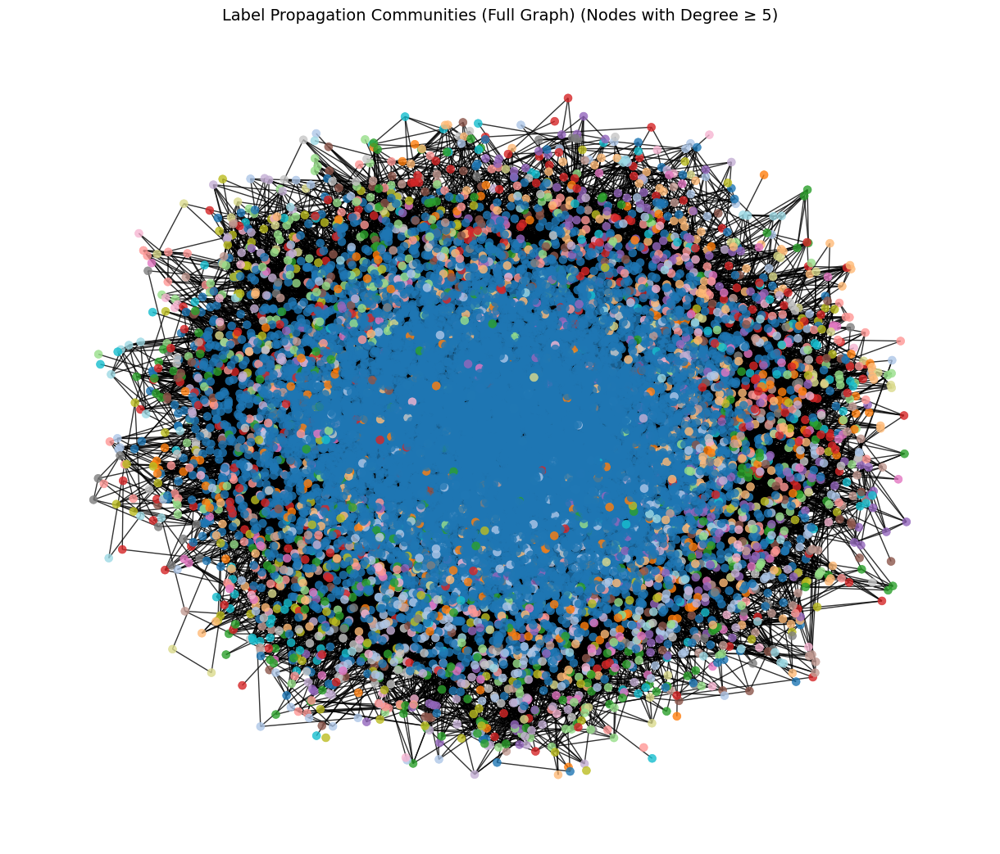

In [192]:
plot_community_core(
    G, 
    label_prop_communities, 
    degree_threshold=5, 
    title="Label Propagation Communities (Full Graph)"
)

### 4. Spectral Methods

### Spectral Clustering on the Moderate-Degree Subgraph

Spectral clustering was applied to the **degree-filtered subgraph (H_gn)** of the Enron network.

**Results:**
- **Number of communities:** 5 
- **Modularity:** computed to evaluate community quality
- **Community sizes:** range from small clusters to larger groups

**Key Points:**
- Uses the **adjacency matrix** of the subgraph to identify clusters based on eigenvectors of the Laplacian.
- Captures **global structure** and separates communities even when connectivity is complex.
- Works well on **moderately sized subgraphs**.

In [413]:
from sklearn.cluster import SpectralClustering
# H_gn is subgraph 


# Create adjacency matrix
A = nx.to_numpy_array(H_gn)

# Number of clusters 
num_clusters = 5


### Implementation

We apply **Spectral Clustering** on the adjacency matrix of the **moderate-degree subgraph (H_gn)**:

- `n_clusters=num_clusters`: specifies the number of communities to detect.  
- `affinity='precomputed'`: uses the adjacency matrix as the similarity measure.  
- `assign_labels='kmeans'`: assigns nodes to clusters in the spectral space using KMeans.  
- `random_state=42`: ensures reproducibility.  

The `fit_predict(A)` method computes the eigenvectors of the graph Laplacian, clusters nodes in spectral space, and returns the **community label for each node**.


In [331]:
sc = SpectralClustering(
    n_clusters=num_clusters,
    affinity='precomputed',  # adjacency matrix
    assign_labels='kmeans',
    random_state=42
)

labels = sc.fit_predict(A)


In [333]:
from collections import defaultdict

comm_dict = defaultdict(set)
for node, label in zip(H_gn.nodes(), labels):
    comm_dict[label].add(node)

spectral_communities = list(comm_dict.values())


### Spectral Clustering on the Moderate-Degree Subgraph

Spectral clustering was applied to the **moderate-degree subgraph (H_gn)** of the Enron network.

**Key Results:**
- **Number of communities:** 5  
- **Modularity:** 0.3332  
- **Community sizes:** range from **31 to 2932 nodes**, with an average size of 686.40 nodes.

**Observations:**
- Spectral clustering effectively captures the **global structure** of the subgraph.
- Detected communities are **moderately well-separated**, reflected by the modularity score.
- Suitable for **medium-sized subgraphs**, offering a scalable alternative to Girvan–Newman while maintaining meaningful partitions.


In [339]:
mod = nx.algorithms.community.modularity(H_gn, spectral_communities)
print(f"Spectral Clustering - Number of communities: {len(spectral_communities)}, Modularity: {mod:.4f}")


Spectral Clustering - Number of communities: 5, Modularity: 0.3332


In [350]:
from statistics import mean

# Compute sizes of communities
sizes = [len(c) for c in spectral_communities]

# Print statistics
print("Spectral Clustering Community Statistics:")
print(f"  Number of communities: {len(spectral_communities)}")
print(f"  Largest community size: {max(sizes)}")
print(f"  Smallest community size: {min(sizes)}")
print(f"  Average community size: {mean(sizes):.2f}")


Spectral Clustering Community Statistics:
  Number of communities: 5
  Largest community size: 2932
  Smallest community size: 31
  Average community size: 686.40


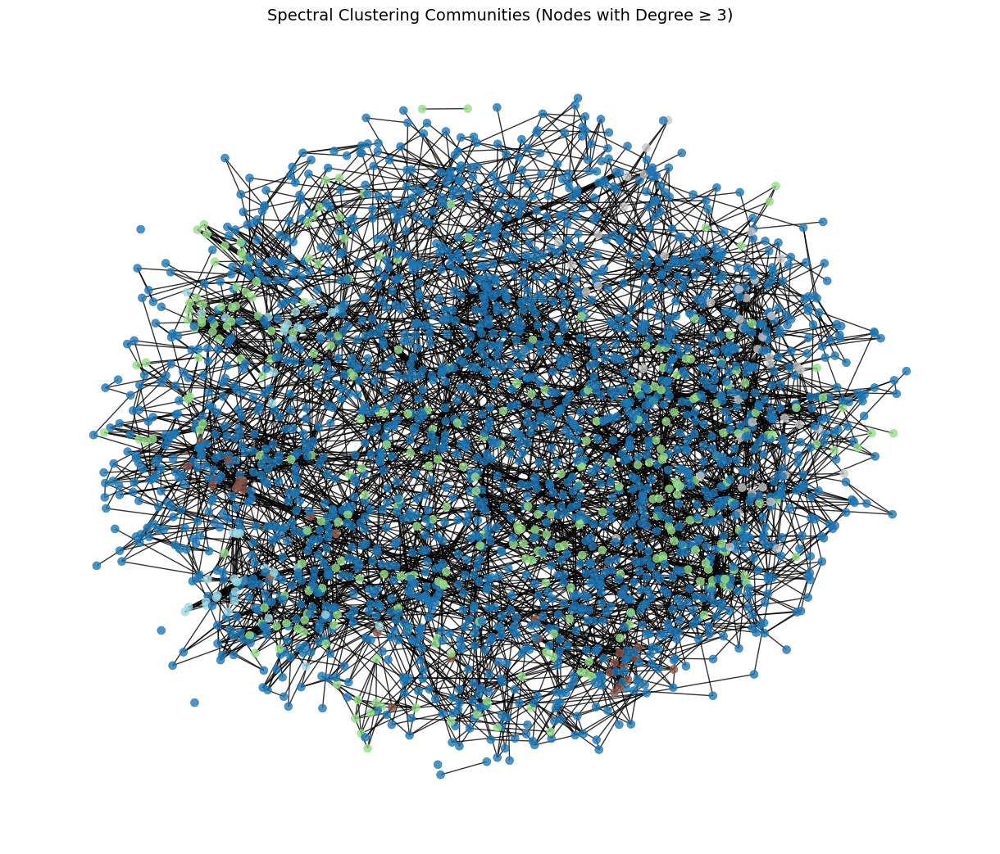

In [337]:
plot_community_core(H_gn, spectral_communities, degree_threshold=3, title="Spectral Clustering Communities")

### Summary

### Enron Email Network - Dataset Overview & EDA

The figure above shows the **entire Enron email communication network** after preprocessing (removing self-loops and disconnected components).  

**Network Statistics:**  
- **Nodes:** 33,696  
- **Edges:** 180,811  
- **Average degree:** 10.73  
- **Density:** 0.00032 (very sparse)  
- **Average clustering coefficient:** 0.5092 (high tendency to form tightly-knit groups)  
- **Degree assortativity:** -0.1165 (slightly disassortative)  

**Observations:**  
- A few **high-degree hubs** dominate the network (max degree 1383), while most nodes have relatively few connections (median degree 3).  
- Nodes like 5038, 273, 458, 140, 1028 are **top-degree nodes**, representing key communicators.  
- Direct visualization of all nodes is **overcrowded**, making it difficult to identify individual communities or smaller structures.  

**Implication for community detection:**  
- Due to the **size and sparsity**, running computationally heavy algorithms like Girvan–Newman on the full network is impractical.  
- Selecting **moderate-degree or core subgraphs** is a practical approach for community detection, allowing hierarchical or spectral methods to reveal meaningful clusters.


### Algorithms applied for Community Detection

### 1. Louvain Community Detection

We applied the **Louvain method** to detect communities in the **full Enron email network**.

**Results:**  
- **Number of communities:** 171  
- **Modularity:** 0.6013 (high, indicating strong community structure)  
- **Community sizes:**  
  - Minimum: 3 nodes  
  - Maximum: 4,139 nodes  
  - Mean: 197 nodes  
  - Median: 8 nodes  

**Observations:**  
- Louvain captures a **rich hierarchical structure**, identifying both **small peripheral communities** and **large hub-centric clusters**.  
- Highly scalable and efficient for large networks, making it more practical than Girvan–Newman for the full graph.  
- Highlights key communication patterns and naturally divides the network into meaningful clusters.


### Preparing a Subgraph for Girvan–Newman (GN) Community Detection

For the Girvan–Newman algorithm, we focus on a **moderate-degree subgraph** rather than the entire network.

**Rationale:**
- The **full Enron network is very large** (~33k nodes, ~180k edges), making GN computationally expensive.
- Nodes with **extremely high or low degrees** can distort edge-betweenness calculations:
  - High-degree hubs dominate the GN splits.
  - Low-degree peripheral nodes add noise without contributing much to meaningful communities.
- We experimented with a **top-degree core subgraph**, but it resulted in **low modularity and less interpretable communities**.
- By selecting **nodes with moderate degrees (10–30)** and extracting the **largest connected component**, we:
  - Reduce computational complexity.
  - Focus on the portion of the network where community structure is most interpretable.
- This approach demonstrates that **GN can produce meaningful communities** on a tractable portion of the network.
- If needed, **further increasing the GN split level** can reveal more communities and improve modularity, but this becomes **computationally intensive**.
- **Proposed strategy:** use coarser methods like **Louvain** to detect broad communities in the full network, then apply GN to those communities to find sub-communities.

---
### 2. Girvan–Newman Community Detection Results on the Moderate-Degree 
**Subgraph (H_gn, Level 3 split):**
- **Modularity:** 0.2581  
- **Number of communities:** 4  
- **Largest community size:** 3,069 nodes  
- **Smallest community size:** 44 nodes  
- **Average community size:** 858 nodes  

**Observations:**  
- The algorithm captures **hierarchical structures** within the subgraph.  
- Community sizes vary widely, from **small peripheral clusters** to **large connected groups**.  
- Modularity is **lower than Louvain on the full network**, reflecting that we are analyzing a **smaller, filtered portion** rather than the entire graph.  
- This demonstrates that GN can produce meaningful communities **when computation is feasible**, but **running it on the full network is impractical**.


### 3. Label Propagation Community Detection

The **Label Propagation algorithm** was applied to the **entire Enron email network**.  

**Results:**
- **Modularity:** 0.3433, indicating moderate community structure.
- **Number of Communities:** 1,679
- **Largest Community Size:** 18,589 nodes
- **Smallest Community Size:** 2 nodes
- **Average Community Size:** 20.07 nodes

**Key Points:**
- Label propagation is **fast and scalable**, making it suitable for large networks.
- **Community sizes vary widely**, reflecting both densely connected hubs and sparse peripheral nodes.
- Captures **local clusters automatically** by iteratively updating node labels based on neighbors.
- Provides a **quick overview of community structure** without heavy computation, unlike GN on the full network.


### 4. Spectral Clustering on the Moderate-Degree Subgraph

Spectral clustering was applied to the **moderate-degree subgraph (H_gn)** of the Enron network.

**Key Results:**
- **Number of communities:** 5  
- **Modularity:** 0.3332  
- **Community sizes:** range from **31 to 2932 nodes**, with an average size of 686.40 nodes.

**Observations:**
- Spectral clustering effectively captures the **global structure** of the subgraph.
- Detected communities are **moderately well-separated**, as reflected by the modularity score.
- Works efficiently on **medium-sized subgraphs**, providing a scalable alternative to Girvan–Newman for meaningful community detection.


### Summary of Community Detection Results

| Algorithm              | Graph Used                  | # Communities | Modularity | Community Size (Min-Max) | Avg Community Size | Observations / Notes |
|------------------------|----------------------------|---------------|------------|--------------------------|------------------|--------------------|
| **Louvain**            | Full graph (33,696 nodes)  | 171           | 0.6013     | 3 - 4,139               | 197              | High modularity, scalable, reveals hierarchical structure. Best for large graphs. |
| **Girvan–Newman (GN)** | Moderate-degree subgraph (3,432 nodes) | 4 (Level 3)   | 0.2581     | 44 - 3,069             | 858              | Hierarchical community detection, interpretable. Too computationally expensive on full graph; modularity lower than Louvain. |
| **Label Propagation**  | Full graph                  | 1,679         | 0.3433     | 2 - 18,589             | 20.07            | Fast and scalable, captures local clusters automatically, but may produce very many small communities. |
| **Spectral Clustering**| Moderate-degree subgraph    | 5             | 0.3332     | 31 - 2,932             | 686.4            | Captures global structure, works on medium-sized subgraphs. Computationally intensive for large graphs. |

---

### Insights and Discussion

- **Best Overall:** Louvain achieves the **highest modularity** and is scalable to the full Enron network. It effectively balances the detection of small and large communities.  
- **Future Scope / Improvements:** A **hybrid approach** can be considered:  
  - Use **Louvain** to detect broad communities across the full network.  
  - Apply **Girvan–Newman or Spectral Clustering** within these communities to uncover finer sub-structures.  
- **Limitations:**  
  - **Girvan–Newman:** computationally expensive; cannot be applied directly on the full network.  
  - **Spectral Clustering:** requires adjacency matrix and is memory-intensive for large graphs.  
  - **Label Propagation:** very fast, but can produce fragmented communities and moderate modularity.  

> **Conclusion:** Louvain is recommended for large-scale networks like Enron. Girivan-Newman and Spectral Clustering are useful for **refining communities on subgraphs** or exploring hierarchical and global patterns.  
